In [43]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest

In [42]:
pip install stattools

  Using cached stattools-0.0.4-py3-none-any.whl (69 kB)
Note: you may need to restart the kernel to use updated packages.


In [2]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../data/cnvnator_cnvs.csv")


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Lenght'] < 200000]
data.describe()

,Start,End,CNV_value,RD,Lenght,T-TEST-EVAL,GAUSSIAN-EVAL
count,2.293410e+05,2.293410e+05,229341.000000,229341.000000,229341.000000,2.293410e+05,2.293410e+05
mean,7.624081e+07,7.626165e+07,1.669449,0.961855,20845.163752,2.255498e-03,4.467658e+08
std,5.695804e+07,5.695533e+07,0.943790,1.173692,50340.430011,7.792185e-03,9.807829e+08
min,1.000000e+00,1.870000e+04,1.000000,0.000000,1000.000000,0.000000e+00,0.000000e+00
25%,2.506670e+07,2.507120e+07,1.000000,0.442979,2400.000000,2.669560e-12,3.820530e-38
50%,6.579500e+07,6.581310e+07,1.000000,0.536395,4900.000000,3.706340e-11,6.200140e-10
75%,1.206971e+08,1.207475e+08,3.000000,1.511890,14600.000000,1.990810e-06,1.040900e+06
max,2.488409e+08,2.489082e+08,3.000000,48.833600,992600.000000,4.999820e-02,2.871000e+09


In [20]:
## input for CNVRanger 
cnvranger = data[['Sample_ID','Chromosome', 'Start', 'End','RD']]
cnvranger.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']
cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)
cnvranger.to_csv('../data/cnvnator_cnvranger_input.csv',  index=False)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_62508/2628830680.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)


In [31]:
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')
data.columns = ['Chromosome', 'Start', 'End','CNVR','Sample_ID','CNV_Start', 'CNV_End', 'RD', 'Lenght']
data

,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0
...,...,...,...,...,...,...,...,...,...
229336,X,NaN,NaN,NaN,SS6004480,153459601,153466400,1,6800.0
229337,X,NaN,NaN,NaN,SS6004480,153474401,153496200,1,21800.0
229338,X,NaN,NaN,NaN,SS6004480,153498901,153518500,1,19600.0
229339,X,NaN,NaN,NaN,SS6004480,154798801,154804000,0,5200.0


In [30]:
## Filter by chromosomes
data_x = distribution[distribution.Chromosome == 'X']
data_no_sex_chr = distribution[distribution.Chromosome != 'Y']
data = data_no_sex_chr[data_no_sex_chr.Chromosome != 'X']

data = data[data['GAUSSIAN-EVAL'] < 0.05]
data

,Sample_ID,Chromosome,Start,End,CNV_value,Type,RD,Lenght,T-TEST-EVAL,GAUSSIAN-EVAL
0,LP6005441-DNA_A01,1,231001,237900,3.0,duplication,2.089230,6900.0,0.000000e+00,5.215800e-35
4,LP6005441-DNA_A01,1,4124201,4127700,1.0,deletion,0.505571,3500.0,4.553500e-11,2.217790e-35
6,LP6005441-DNA_A01,1,13698701,13773800,1.0,deletion,0.498061,75100.0,2.122140e-12,1.148110e-26
7,LP6005441-DNA_A01,1,13777401,13781300,1.0,deletion,0.508675,3900.0,4.086470e-11,5.781320e-35
9,LP6005441-DNA_A01,1,35101401,35111900,1.0,deletion,0.476836,10500.0,1.517830e-11,5.531960e-128
...,...,...,...,...,...,...,...,...,...,...
229286,SS6004480,9,106568301,106569700,1.0,deletion,0.466723,1400.0,1.565730e-05,1.842890e-10
229287,SS6004480,9,131412001,131414100,1.0,deletion,0.451900,2100.0,1.556540e-07,2.014000e-09
229290,SS6004480,9,138214101,138217600,1.0,deletion,0.525251,3500.0,4.553500e-11,1.258500e-18
229291,SS6004480,9,138479101,138480200,1.0,deletion,0.000000,1100.0,1.448840e-10,4.148920e-61


In [ ]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
#plt.savefig('../plots/distribution.png', transparent=True)
plt.show()

KeyboardInterrupt: 

In [33]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv#.loc[cnv['Chr'] == '8']




Sample_ID,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,1,176101.0,355800.0,2.0,1.0,1.0,1.0,1.25,1.0,1.0,...,1.0,0.25,1.0,0.500000,1.000000,2.0,0.666667,1.0,1.0,1.0
1,1,449901.0,564900.0,0.0,0.5,0.0,0.0,0.00,0.0,0.0,...,0.0,0.00,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0
2,1,665601.0,843800.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,...,1.5,1.25,2.0,1.333333,1.666667,1.5,1.500000,2.0,NaN,NaN
3,1,891701.0,900200.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.00,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0
4,1,1007801.0,1015200.0,0.0,NaN,0.0,0.0,0.00,0.0,0.0,...,0.0,0.00,0.0,0.000000,0.000000,0.0,1.000000,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7775,9,140136301.0,140189600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7776,9,140197201.0,140222900.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7777,9,140245301.0,140317100.0,0.0,0.0,0.0,0.0,0.00,NaN,0.0,...,1.0,0.00,NaN,0.000000,0.000000,0.0,NaN,NaN,0.0,0.0
7778,9,140387601.0,140498800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.00,NaN,2.000000,NaN,2.0,NaN,2.0,NaN,NaN


In [34]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,1.000000,0.5,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A04,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A05,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A06,1.250000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A08,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.000000,0.0,1.5,0.0,0.0,0.0,2.0,2.0,2.0,2.0,...,0.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
SS6004477,0.666667,0.0,1.5,2.0,1.0,0.0,2.0,1.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,1.000000,0.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0


In [35]:
features = anotation.loc[:,["7-Gender","10-Region", "11-Country",]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,7-Gender,10-Region,11-Country,0,1,2,3,4,5,6,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
LP6005443-DNA_B06,F,WestEurasia,Iceland,0.500000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,1.333333,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,1.000000,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,1.250000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_G11,M,Africa,SierraLeone,1.333333,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,F,WestEurasia,Russia,1.000000,0.0,1.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_A06,M,EastAsia,Myanmar,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_B06,M,EastAsia,Myanmar,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,2.0
LP6005441-DNA_B08,F,Africa,Congo,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [36]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [37]:

dt_groupped

[                  7-Gender    10-Region      11-Country         0    1    2  \
 LP6005443-DNA_B06        F  WestEurasia         Iceland  0.500000  0.0  2.0   
 LP6005442-DNA_D08        F  WestEurasia         Iceland  1.333333  0.0  2.0   
 LP6005442-DNA_C02        M  WestEurasia        Abkhazia  1.000000  0.0  2.0   
 LP6005442-DNA_D02        M  WestEurasia          Russia  1.000000  0.0  1.0   
 LP6005442-DNA_F04        M  WestEurasia          Jordan  0.500000  0.0  2.0   
 ...                    ...          ...             ...       ...  ...  ...   
 LP6005443-DNA_A06        M  WestEurasia          Greece  0.500000  0.0  2.0   
 LP6005441-DNA_H12        F  WestEurasia  Italy(Tuscany)  1.000000  0.0  2.0   
 LP6005441-DNA_G10        M  WestEurasia          Russia  1.000000  0.0  2.0   
 LP6005441-DNA_H10        F  WestEurasia          Russia  1.000000  0.0  1.0   
 LP6005592-DNA_G01        M  WestEurasia           Yemen  1.000000  0.0  2.0   
 
                      3    4    5    6

In [52]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


/Users/luciabazan/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3745: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3745: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var 

,0,1,2,3,4,5,6,7,8,9,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
WestEurasia-SouthAsia,0.008951,0.021117,0.008930,0.028539,0.009192,0.017075,0.013699,NaN,0.010758,0.018555,...,0.022394,0.020612,NaN,0.013699,0.023501,0.014306,NaN,0.012835,0.018555,0.018555
WestEurasia-Africa,0.008789,0.013699,0.013018,0.009288,0.013865,0.021128,0.013699,0.022727,0.013699,0.018940,...,0.013294,0.010016,0.022727,0.009676,0.008655,0.017850,0.022727,0.181449,0.027678,0.008750
WestEurasia-CentralAsiaSiberia,0.025212,0.024486,0.047610,0.011286,0.024807,0.013423,0.013699,NaN,0.013699,0.017473,...,0.020462,0.047310,NaN,0.013699,0.021325,0.016111,NaN,0.011836,0.017473,0.017473
WestEurasia-Oceania,0.013838,0.017448,0.010445,0.012896,0.011436,0.018085,0.013699,0.041667,0.017448,0.017159,...,0.010624,0.026344,NaN,0.013699,0.010311,0.014829,NaN,0.012459,0.017159,0.017159
WestEurasia-America,0.036415,0.013699,0.012277,0.014408,0.046694,0.011823,0.013699,NaN,0.013699,0.016939,...,0.023830,0.021192,NaN,0.013699,0.010609,0.030630,NaN,0.011726,0.022097,0.016939
WestEurasia-EastAsia,0.008742,0.009323,0.009007,0.008865,0.008408,0.009550,0.013699,NaN,0.013699,0.019084,...,0.009794,0.020547,NaN,0.013699,0.011116,0.010372,0.021739,0.034592,0.019084,0.019084
SouthAsia-Africa,0.012566,0.039569,0.016973,0.044886,0.015571,0.051116,NaN,0.022727,0.025641,NaN,...,0.044333,0.017710,0.022727,0.022727,0.033670,0.043562,0.022727,0.215497,0.042370,0.022727
SouthAsia-CentralAsiaSiberia,0.038874,0.016569,0.066501,0.059606,0.030303,0.016204,NaN,NaN,0.025641,NaN,...,NaN,0.027315,NaN,NaN,NaN,0.039095,NaN,0.027890,NaN,NaN
SouthAsia-Oceania,0.020080,0.016346,0.016013,0.068306,0.016338,0.054406,NaN,0.041667,0.017812,NaN,...,0.041667,0.017083,NaN,NaN,0.041667,0.036044,NaN,0.016004,NaN,NaN
SouthAsia-America,0.055461,0.035202,0.018683,0.075501,0.062369,0.037055,NaN,NaN,0.025641,NaN,...,0.075501,0.016492,NaN,NaN,0.045455,0.065934,NaN,0.016983,0.045455,NaN


In [53]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,28,29,43,66,91,169,170,171,202,211,...,7723,7725,7731,7752,7753,7758,7762,7765,7766,7777
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-CentralAsiaSiberia,True,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-America,True,True,False,False,False,True,False,True,False,False,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
SouthAsia-CentralAsiaSiberia,True,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,True,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,True,False,False,False,False,True,True,True,False,True,...,False,False,False,False,True,False,True,False,False,False


In [54]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', cnv['Chromosome'])
vst_dt.insert (1, 'start', cnv['Start'])
vst_dt.insert (2, 'end', cnv['End'])
#vst_dt.insert (3, 'type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,1,176101.0,355800.0,0.00895,0.00879,0.02521,0.01384,0.03641,0.00874,0.01257,...,0.03099,0.02162,0.04594,0.01256,0.05774,0.02413,0.04194,0.07434,0.01704,0.05870
1,1,449901.0,564900.0,0.02112,0.01370,0.02449,0.01745,0.01370,0.00932,0.03957,...,0.03704,0.04167,0.00000,0.02174,0.02232,0.03704,0.02312,0.04167,0.01746,0.02174
2,1,665601.0,843800.0,0.00893,0.01302,0.04761,0.01045,0.01228,0.00901,0.01697,...,0.03579,0.02098,0.01540,0.01903,0.08638,0.04777,0.06274,0.02541,0.01442,0.01878
3,1,891701.0,900200.0,0.02854,0.00929,0.01129,0.01290,0.01441,0.00886,0.04489,...,0.01421,0.01546,0.01677,0.01115,0.01990,0.02132,0.01398,0.02192,0.01538,0.01680
4,1,1007801.0,1015200.0,0.00919,0.01387,0.02481,0.01144,0.04669,0.00841,0.01557,...,0.01850,0.01603,0.04168,0.01659,0.03143,0.03434,0.03144,0.07107,0.01552,0.06172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7775,9,140136301.0,140189600.0,0.01431,0.01785,0.01611,0.01483,0.03063,0.01037,0.04356,...,0.01415,0.01511,0.02896,0.03252,0.01975,0.03704,0.02935,0.04167,0.02702,0.05210
7776,9,140197201.0,140222900.0,0.00000,0.02273,0.00000,0.00000,0.00000,0.02174,0.02273,...,0.02273,0.02273,0.02273,0.01112,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174
7777,9,140245301.0,140317100.0,0.01284,0.18145,0.01184,0.01246,0.01173,0.03459,0.21550,...,0.13294,0.18085,0.16868,0.29705,0.02949,0.02780,0.06612,0.02192,0.03113,0.03520
7778,9,140387601.0,140498800.0,0.01856,0.02768,0.01747,0.01716,0.02210,0.01908,0.04237,...,0.03872,0.03759,0.01576,0.04404,0.00000,0.04545,0.00000,0.04545,0.00000,0.04545


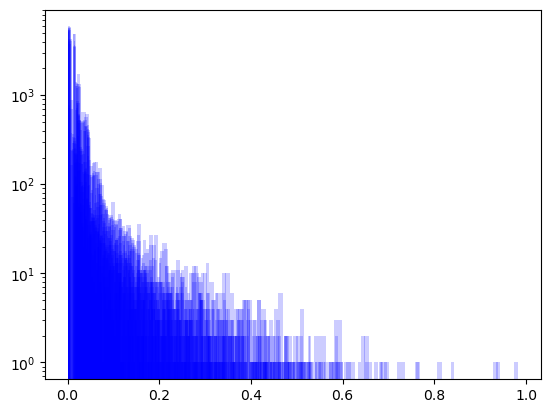

In [55]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,3:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")

In [56]:
chr8 = vst_dt[vst_dt['chr'] == '8']
chr8[chr8['start'] > 22700000].sort_values(by='start', ascending=True).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
7182,8,22907701.0,23209600.0,0.01758,0.05242,0.01671,0.39900,0.01629,0.01800,0.10150,...,0.08760,0.22662,0.08012,0.10773,0.50809,0.00000,0.00000,0.48434,0.55850,0.00000
7183,8,24145301.0,24151100.0,0.07871,0.14483,0.01199,0.02453,0.01401,0.01037,0.02403,...,0.10108,0.06559,0.14339,0.11426,0.02597,0.03434,0.01371,0.05876,0.02095,0.02543
7184,8,24256401.0,24267700.0,0.01370,0.01370,0.01370,0.01370,0.01370,0.00859,0.00000,...,0.00000,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174
7185,8,24441601.0,24468400.0,0.01856,0.02783,0.01747,0.01716,0.01694,0.01908,0.05639,...,0.05020,0.04830,0.04692,0.05920,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
7186,8,24972301.0,24991500.0,0.08725,0.11008,0.06685,0.04887,0.13533,0.10497,0.01351,...,0.01818,0.02573,0.02500,0.01123,0.02146,0.04895,0.01651,0.06667,0.02308,0.02639
7187,8,25061701.0,25074200.0,0.17050,0.15811,0.01062,0.19685,0.02814,0.06077,0.01222,...,0.11210,0.01622,0.06729,0.04046,0.16716,0.03265,0.04493,0.10606,0.05758,0.02175
7188,8,25120401.0,25124400.0,0.00000,0.05183,0.00000,0.00000,0.00000,0.00000,0.04489,...,0.04078,0.03951,0.03860,0.04676,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
7189,8,25350701.0,25361400.0,0.01370,0.01370,0.01370,0.01370,0.01370,0.01370,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
7190,8,25410401.0,25416700.0,0.16581,0.01092,0.13981,0.02069,0.12068,0.05785,0.18136,...,0.17118,0.02273,0.15942,0.07387,0.18174,0.02107,0.03382,0.18182,0.08065,0.02758
7191,8,25549601.0,25578200.0,0.01370,0.00968,0.01370,0.01370,0.01370,0.01370,0.02273,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


In [57]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
7447,8,112282301.0,112299600.0,0.21501,0.37278,0.38859,0.50765,0.26320,0.38846,0.04326,...,0.01434,0.03340,0.02672,0.01141,0.03604,0.03704,0.01370,0.08722,0.02868,0.02985
7106,8,3995301.0,4246600.0,0.01327,0.42080,0.02924,0.40500,0.37345,0.05294,0.34487,...,0.26482,0.01472,0.01569,0.22617,0.29213,0.26785,0.01761,0.02255,0.21801,0.19365
7182,8,22907701.0,23209600.0,0.01758,0.05242,0.01671,0.39900,0.01629,0.01800,0.10150,...,0.08760,0.22662,0.08012,0.10773,0.50809,0.00000,0.00000,0.48434,0.55850,0.00000
7126,8,11245401.0,11312700.0,0.08120,0.05488,0.08516,0.27669,0.22504,0.30478,0.25332,...,0.27648,0.59772,0.52441,0.57744,0.15142,0.10222,0.10903,0.03145,0.02115,0.01475
7553,8,143353701.0,143494800.0,0.01370,0.01370,0.10625,0.26419,0.21422,0.05242,0.00000,...,0.11001,0.25556,0.21212,0.05511,0.06616,0.04356,0.02252,0.02597,0.10920,0.07404
7499,8,123111701.0,123118600.0,0.01616,0.10174,0.07782,0.22771,0.13738,0.05242,0.06237,...,0.01850,0.03890,0.01597,0.02310,0.07012,0.03030,0.01525,0.03793,0.08455,0.03340
7238,8,37930801.0,37938700.0,0.02968,0.00877,0.01943,0.22317,0.03063,0.01402,0.02884,...,0.02170,0.22399,0.04692,0.02005,0.16005,0.09136,0.04708,0.33824,0.30357,0.02899
7549,8,140325901.0,140334200.0,0.00000,0.00000,0.00000,0.20879,0.00000,0.00000,0.00000,...,0.00000,0.18952,0.00000,0.00000,0.16667,0.00000,0.00000,0.15625,0.19141,0.00000
7563,8,146281801.0,146364100.0,0.00904,0.02810,0.01650,0.20138,0.01058,0.01128,0.03976,...,0.01869,0.34619,0.03860,0.02162,0.28615,0.02871,0.01527,0.21469,0.26364,0.01680
7244,8,39217601.0,39398500.0,0.03279,0.17377,0.05219,0.17032,0.01309,0.16689,0.08469,...,0.05420,0.01688,0.22138,0.01126,0.08088,0.09957,0.04880,0.28669,0.01762,0.20837


In [58]:
#### SAVING VST FILE
#vst_dt.to_csv('../data/vst_results_cnvnator.csv')
vst_dt['chr'] = vst_dt['chr'].astype(int)
vst_dt = vst_dt.sort_values(by='chr')
vst_dt

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,1,176101.0,355800.0,0.00895,0.00879,0.02521,0.01384,0.03641,0.00874,0.01257,...,0.03099,0.02162,0.04594,0.01256,0.05774,0.02413,0.04194,0.07434,0.01704,0.05870
418,1,171112401.0,171116300.0,0.01370,0.01370,0.01370,0.01370,0.01370,0.01370,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
419,1,171129801.0,171133100.0,0.01370,0.01370,0.01370,0.01370,0.01370,0.01370,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
420,1,171774301.0,171791700.0,0.01370,0.01370,0.01370,0.01370,0.01914,0.01370,0.00000,...,0.00000,0.00000,0.04545,0.00000,0.00000,0.04545,0.00000,0.04545,0.00000,0.04545
421,1,172654201.0,172679000.0,0.01370,0.01370,0.01370,0.01370,0.01370,0.01370,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4351,22,29060301.0,29063500.0,0.01370,0.01370,0.01370,0.01745,0.01370,0.01370,0.00000,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.00000,0.00000,0.04167,0.04167,0.00000
4350,22,29037201.0,29040000.0,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,0.02273,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4349,22,27915301.0,28217100.0,0.01616,0.01370,0.01370,0.02797,0.01370,0.02549,0.02564,...,0.00000,0.04167,0.00000,0.03261,0.04167,0.00000,0.03001,0.04167,0.01430,0.02899
4367,22,37397001.0,38301300.0,0.03862,0.00914,0.02849,0.04670,0.04466,0.06421,0.04046,...,0.03171,0.05736,0.05551,0.07193,0.03704,0.03704,0.03704,0.00000,0.00000,0.00000


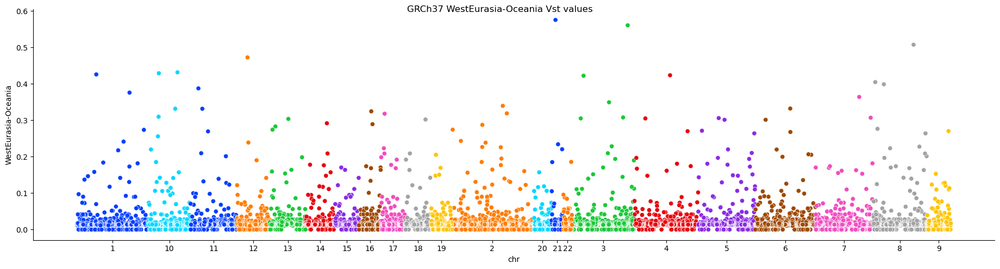

In [59]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='WestEurasia-Oceania', aspect=3.7, 
                  hue='chr', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('chr')['i'].median()
plot.ax.set_xlabel('chr'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

<h1> Computing permutation for each pair-group whole samples

In [60]:
from stattools.resampling import PermutationTest
PermutationTest

stattools.resampling.permutation.PermutationTest

In [61]:
pt = PermutationTest(dt_group.get_group(str('WestEurasia'))[176], dt_group.get_group(str('America'))[176], stat=vst, n_perm=999)

In [62]:
p_value_ = pt.p_value()
print(f"p-value: {p_value_:.4f}")

p-value: 1.0000


<h1> Deletions PCA

In [63]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,28,29,43,66,91,169,170,171,202,211,...,7713,7723,7725,7752,7753,7758,7762,7765,7766,7777
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,1.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_A08,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,1.0,0.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [64]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,28,29,43,66,91,169,170,171,202,211,...,7713,7723,7725,7752,7753,7758,7762,7765,7766,7777
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,1.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_A08,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,1.0,0.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [65]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [66]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.397371,-4.880800,4.853884,0.615047,-0.523402,-1.743970,0.109423,1.552097,0.631074,0.014203
LP6005441-DNA_A04,F,America,Colombia,-4.092935,-2.320603,-5.759670,5.842585,1.871562,-3.007227,0.102433,1.973603,3.105924,0.945655
LP6005441-DNA_A05,M,WestEurasia,France,-0.147293,6.172520,0.133662,1.097528,0.426550,-1.830050,-0.585507,-1.070984,2.156652,0.754328
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),0.149958,5.039153,0.811002,-0.121364,-0.469847,-2.307647,-1.426769,1.156300,-0.932334,-0.349242
LP6005441-DNA_A08,M,Africa,Congo,10.963544,-2.470812,-2.068657,-0.672016,1.238773,0.170487,-1.789893,0.224351,1.773564,1.000384
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-3.327523,-1.901169,-4.192993,7.491278,0.074804,-2.204844,-0.260660,-1.043647,2.444176,-0.543627
SS6004477,M,Oceania,Australia,1.019966,-5.745655,9.813149,2.687426,0.257214,-1.982144,-0.723109,1.191839,0.189757,1.062819
SS6004478,U,Oceania,Australia,-0.278386,-5.024362,7.490911,2.919735,-0.976773,-0.895730,0.782427,-0.443094,0.997999,0.271480
SS6004479,F,America,Mexico,-4.791348,-2.360441,-5.703390,7.526688,-0.777997,0.379261,0.831026,4.756568,1.397020,-1.369847


In [67]:
pca.explained_variance_ratio_

array([0.07502179, 0.05207715, 0.03668483, 0.02372345, 0.01176251,
       0.01096257, 0.01016962, 0.01007563, 0.00973013, 0.00965534])

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

Count of groups by factor: 7
            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M   

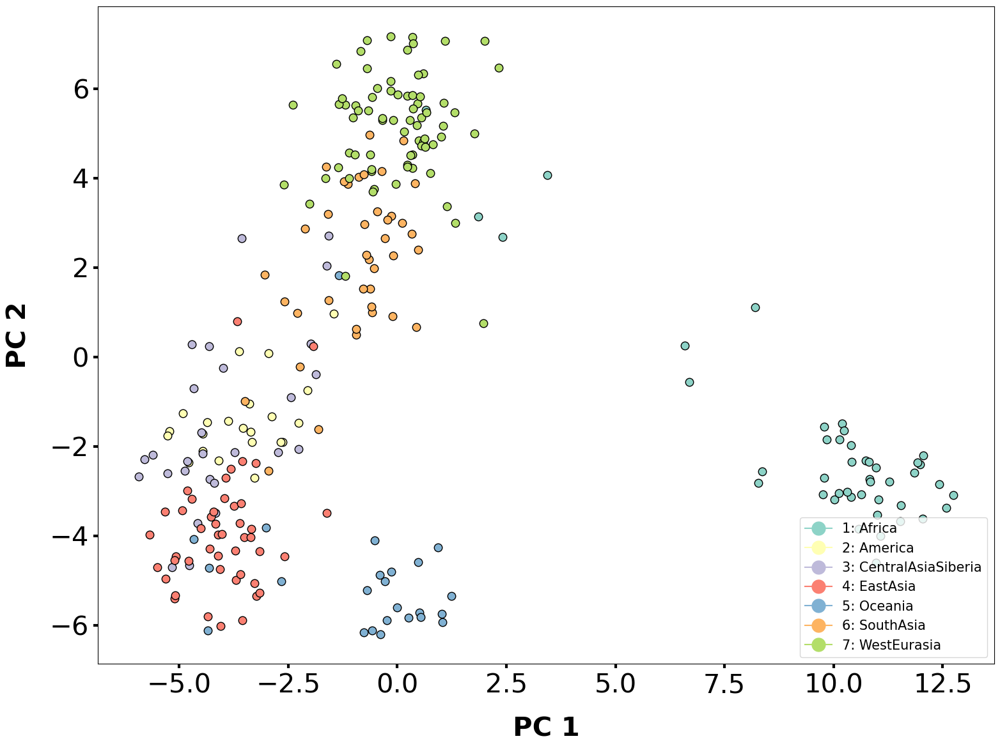

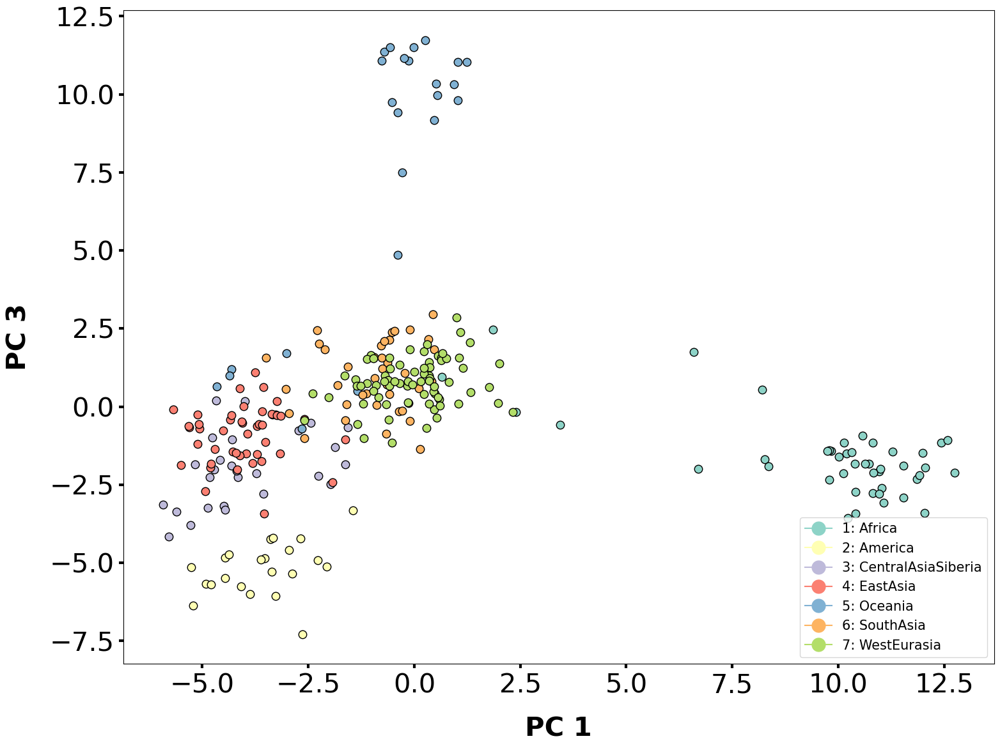

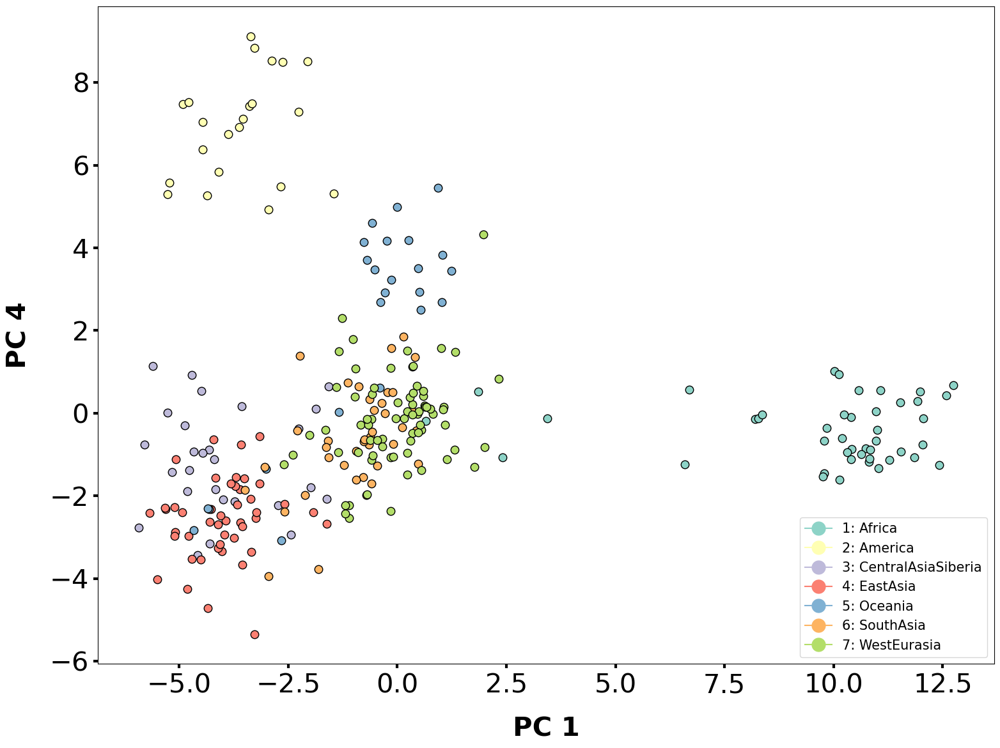

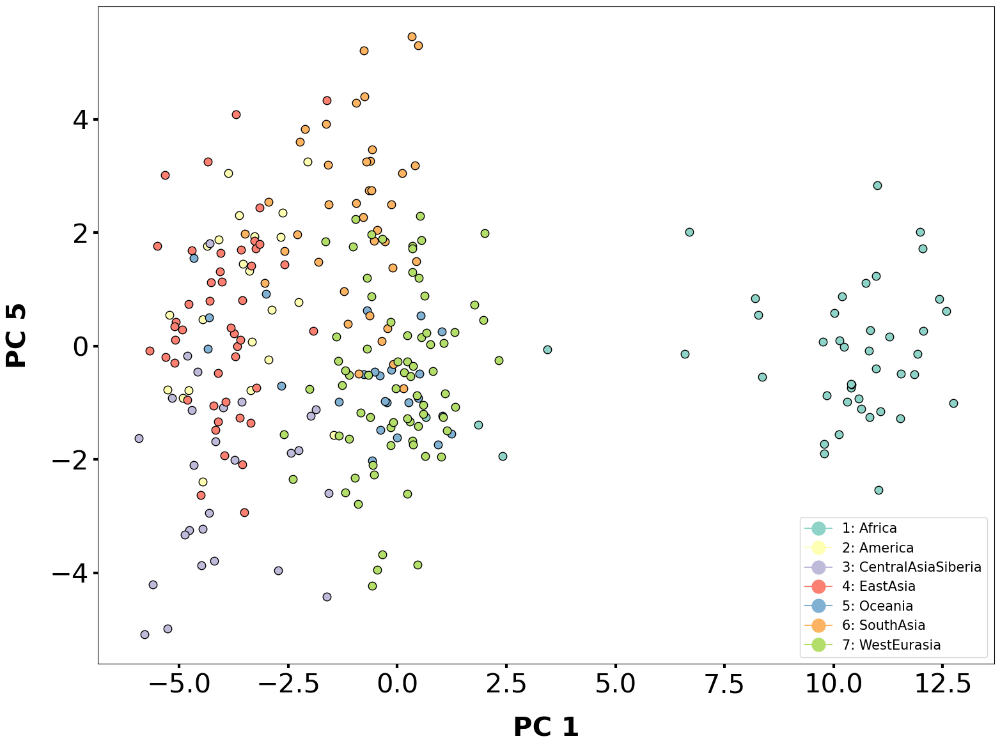

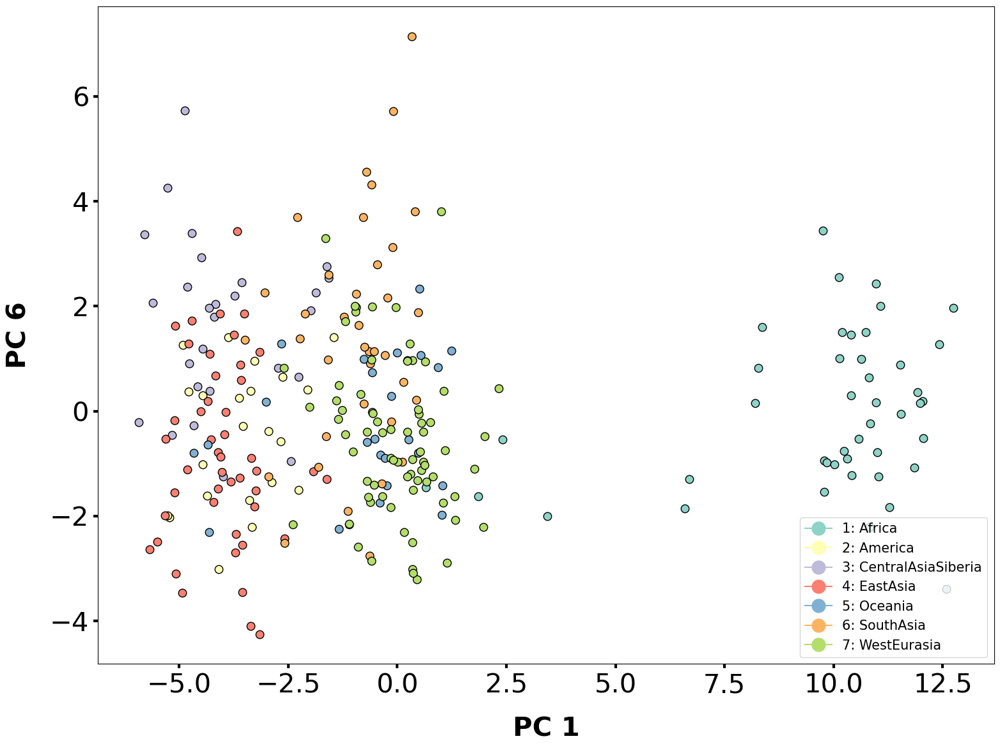

...

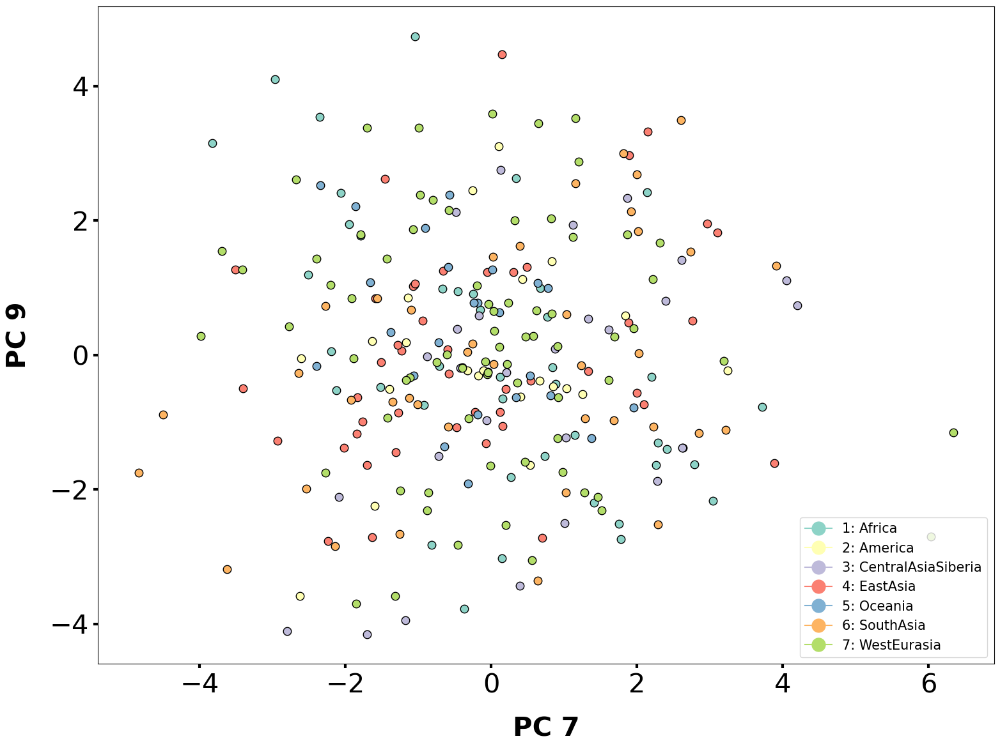

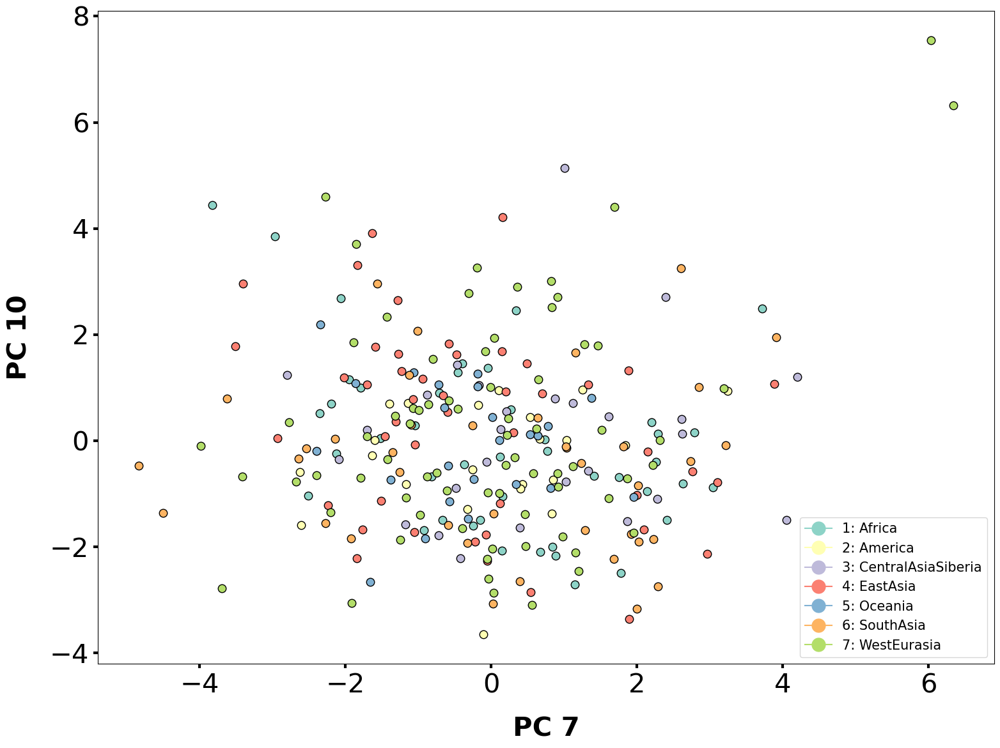

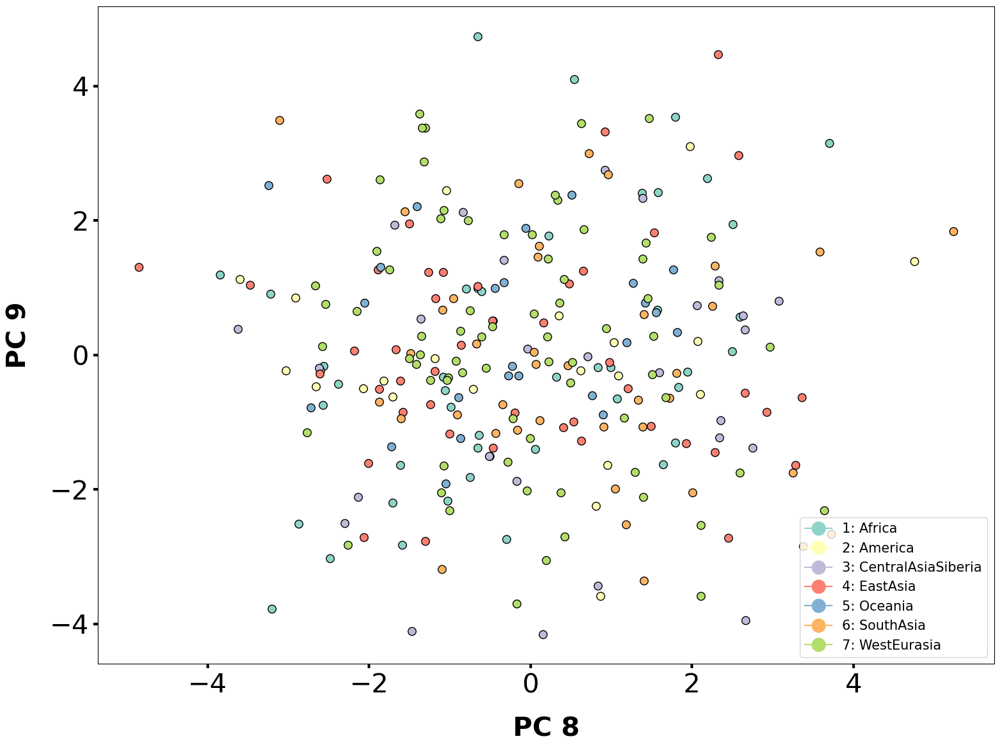

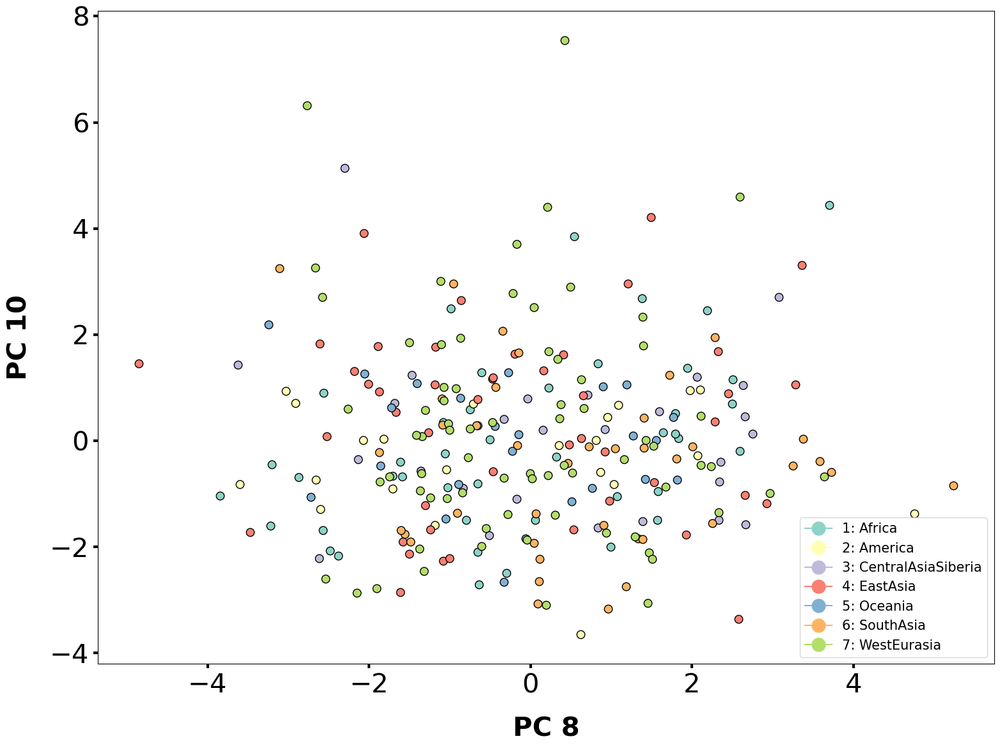

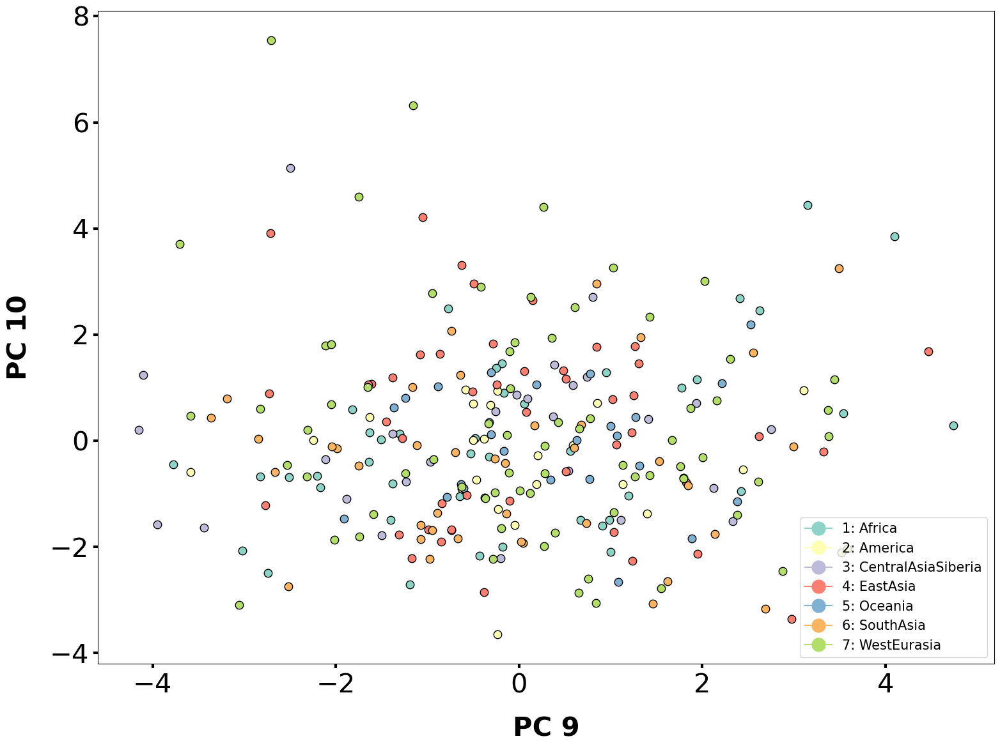

In [68]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

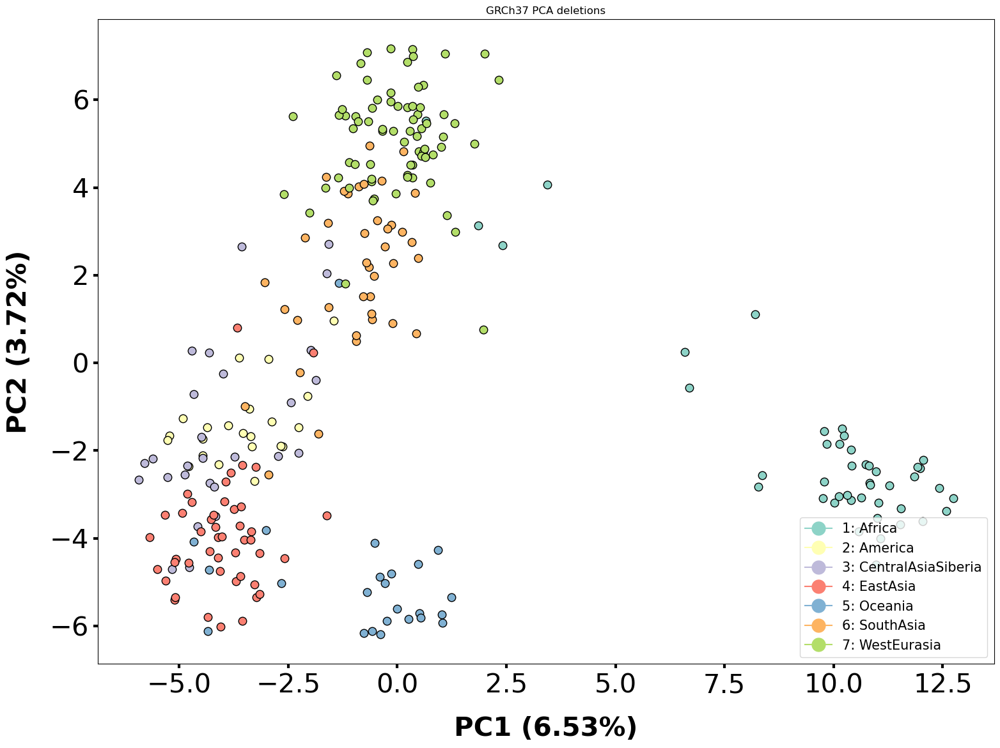

In [69]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.53%)', label_vertical='PC2 (3.72%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

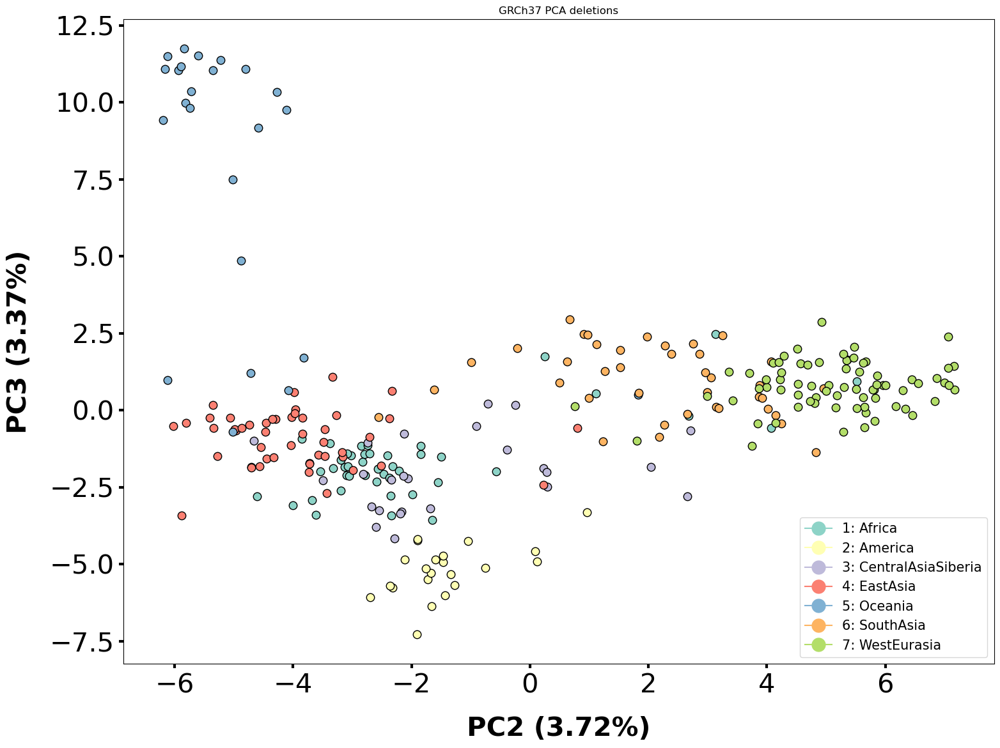

In [70]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (3.72%)', label_vertical='PC3 (3.37%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

<h1> Duplications

In [71]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


,346
Sample_ID,
LP6005441-DNA_A03,2.166667
LP6005441-DNA_A04,2.500000
LP6005441-DNA_A05,1.833333
LP6005441-DNA_A06,1.833333
LP6005441-DNA_A08,1.846154
...,...
SS6004476,1.888889
SS6004477,2.333333
SS6004478,2.500000


In [72]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [73]:
#PCA
pca = PCA(n_components=5)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

ValueError: n_components=5 must be between 0 and min(n_samples, n_features)=1 with svd_solver='full'

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

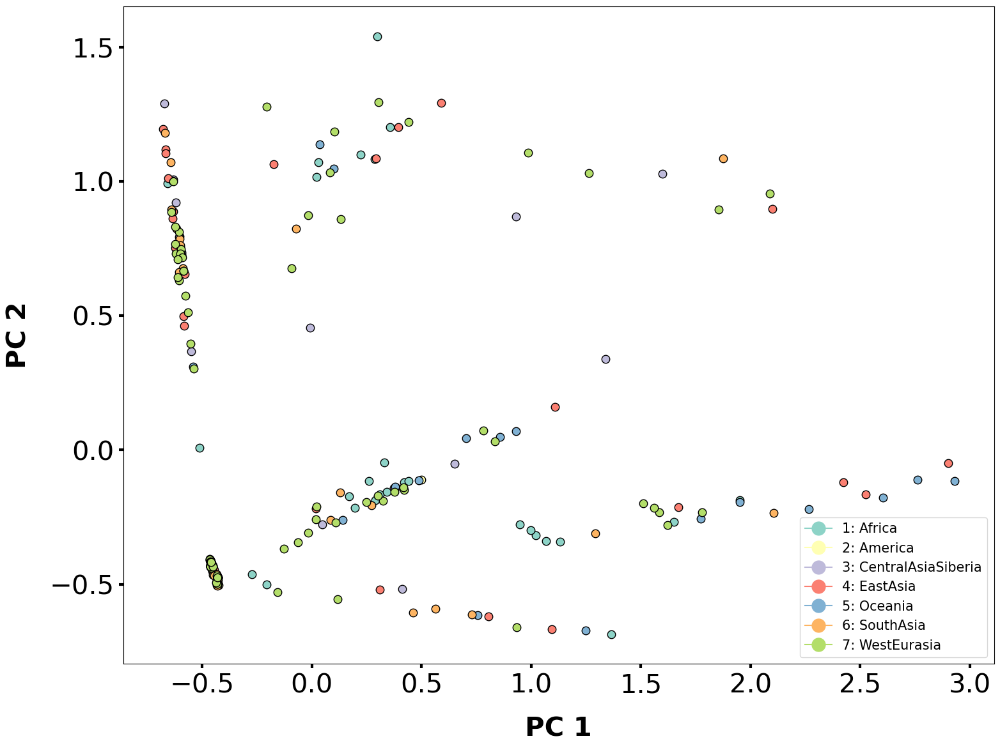

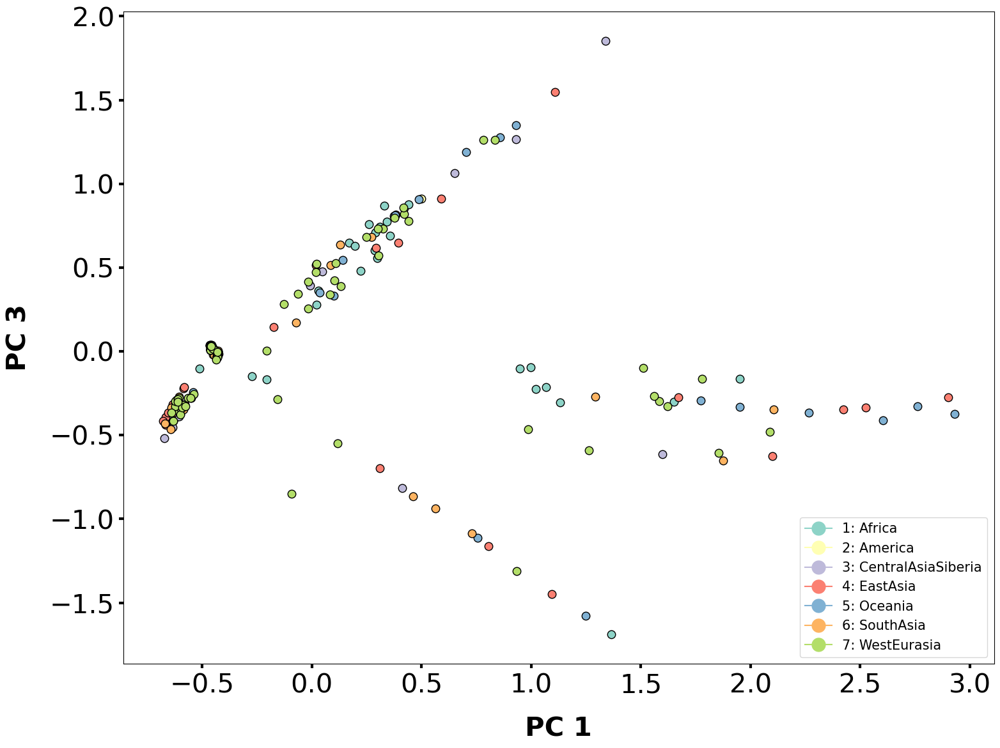

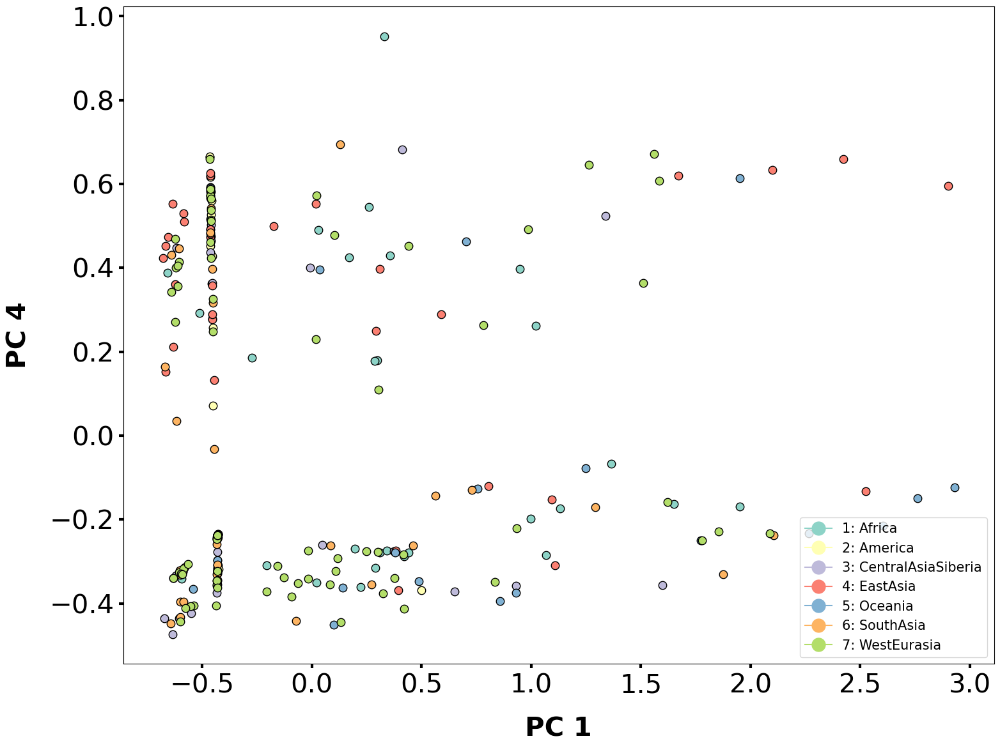

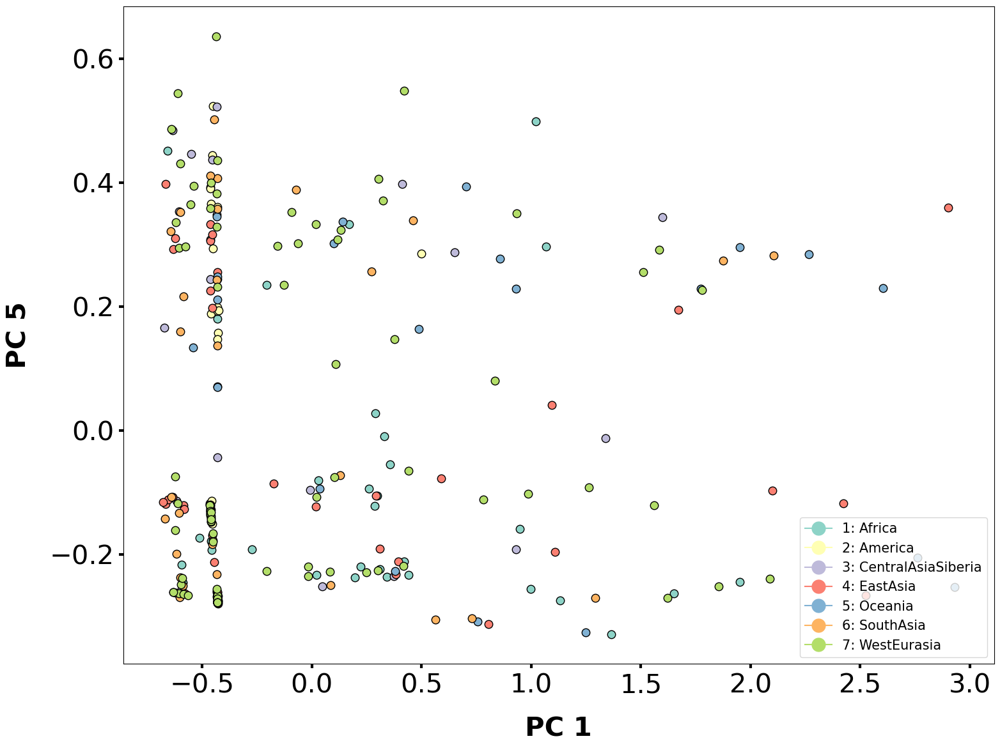

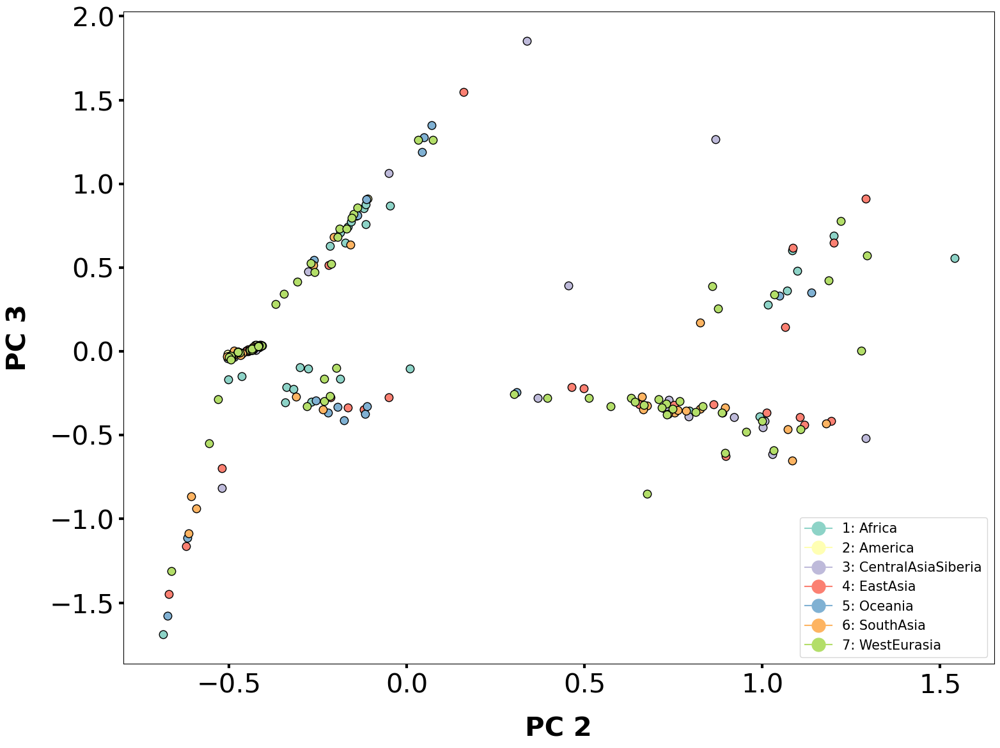

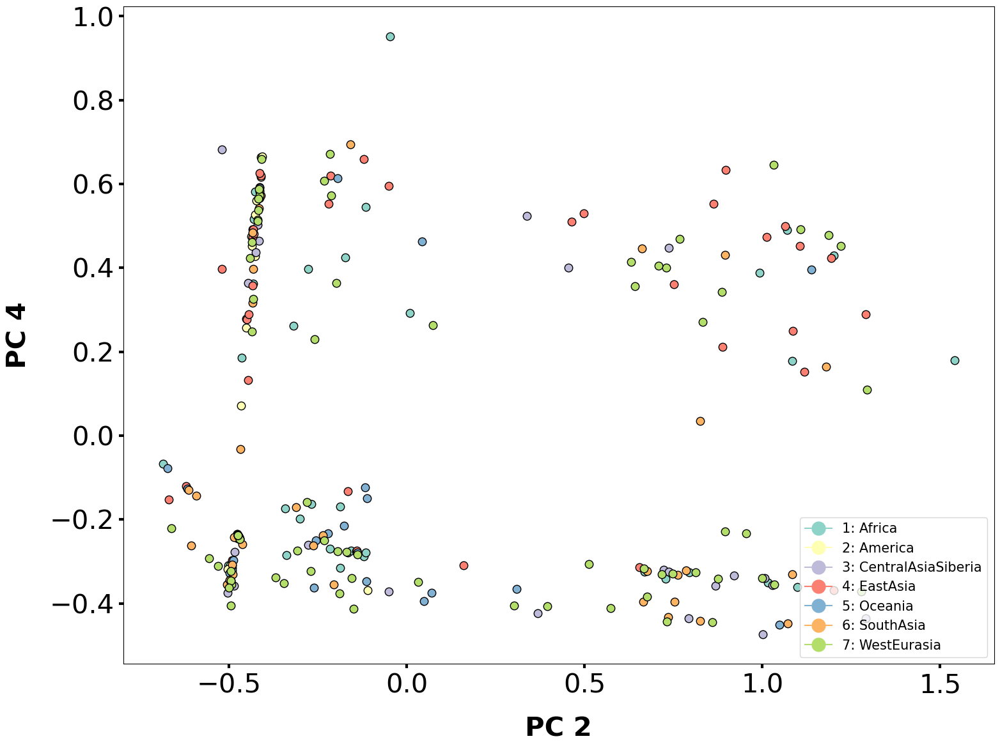

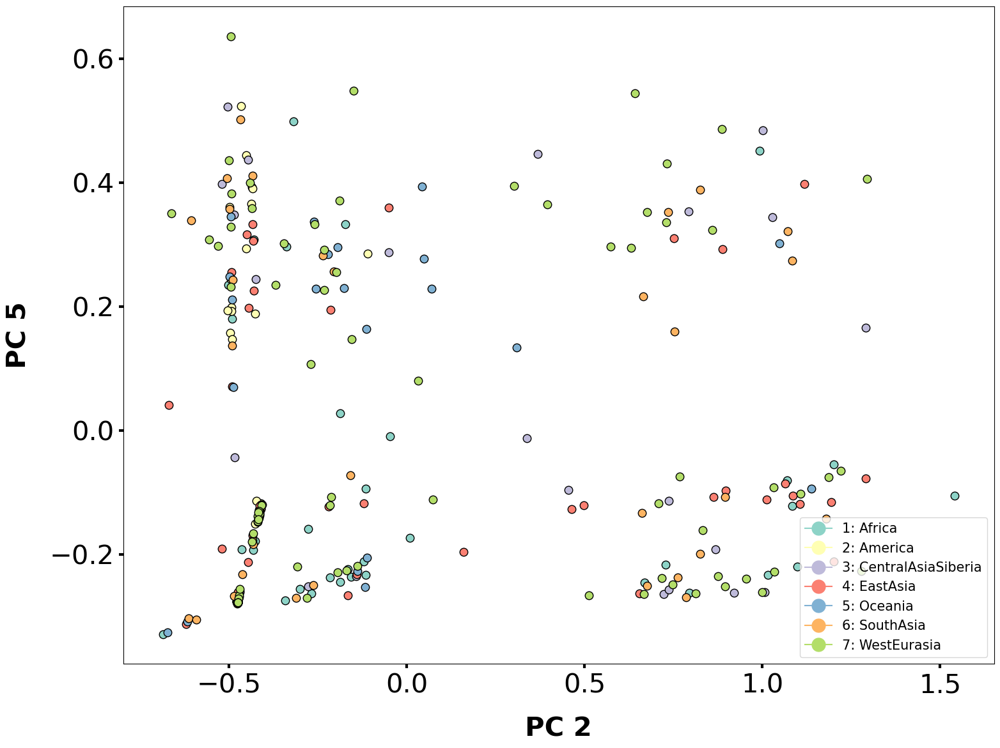

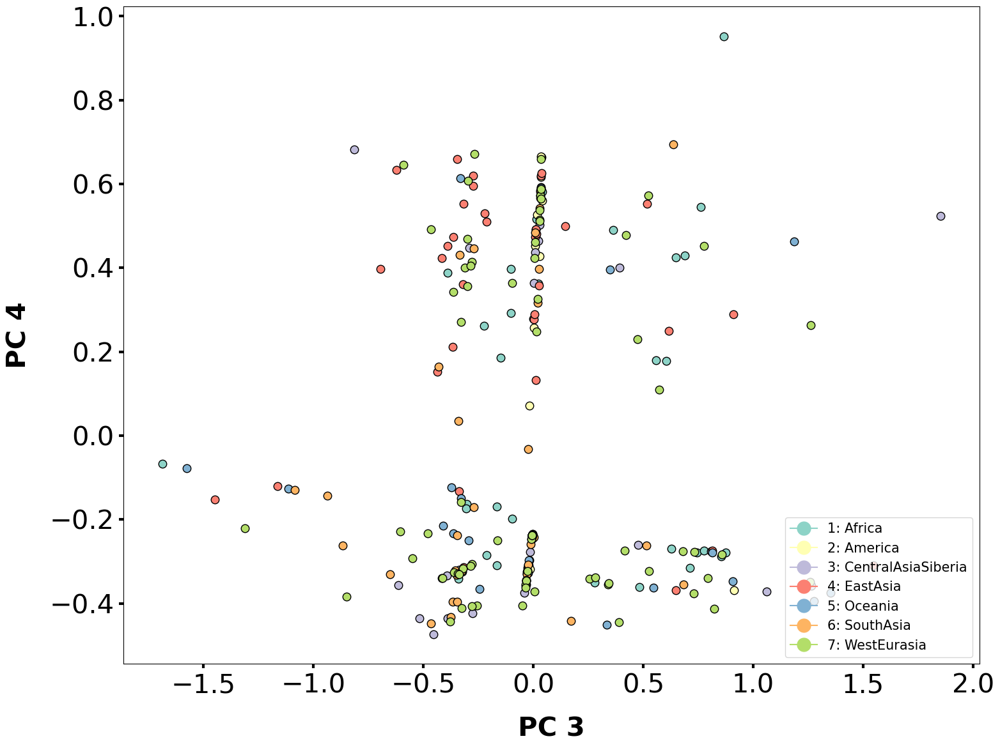

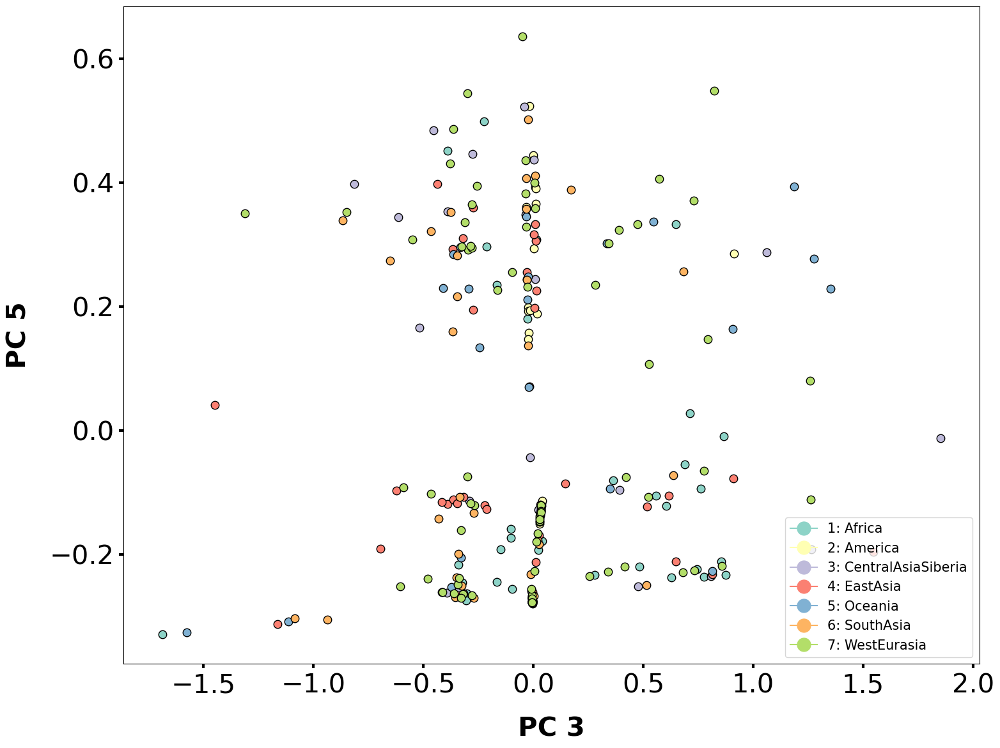

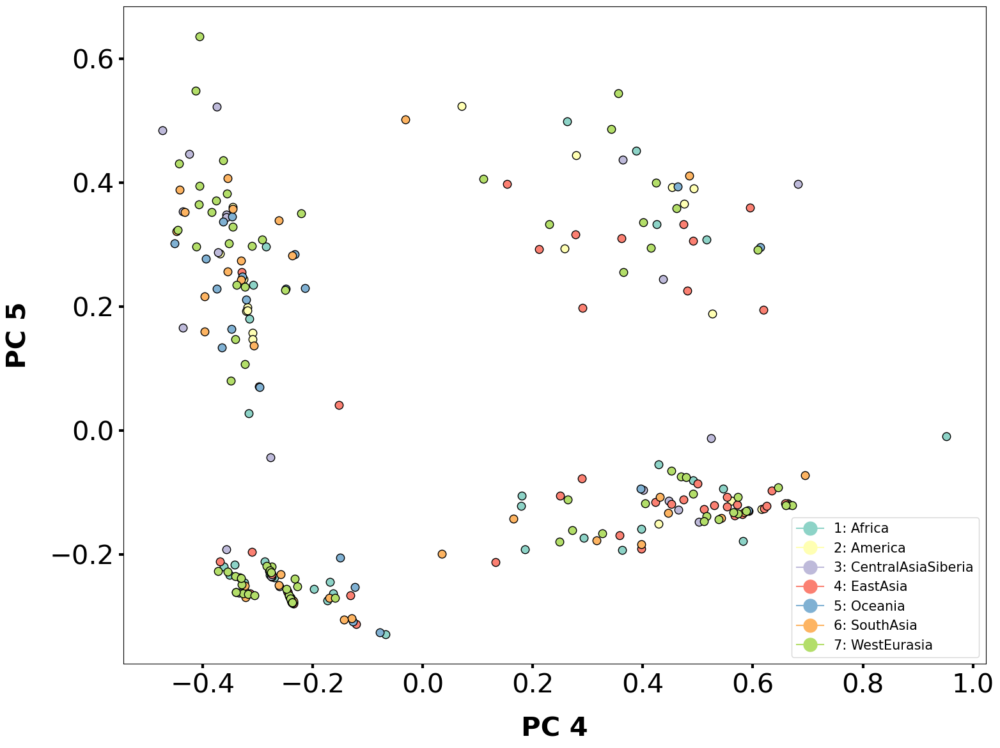

In [39]:
components = [1,2,3,4,5]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [40]:
pca.explained_variance_ratio_

array([0.42552687, 0.24613321, 0.15993992, 0.09841705, 0.04728886])

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

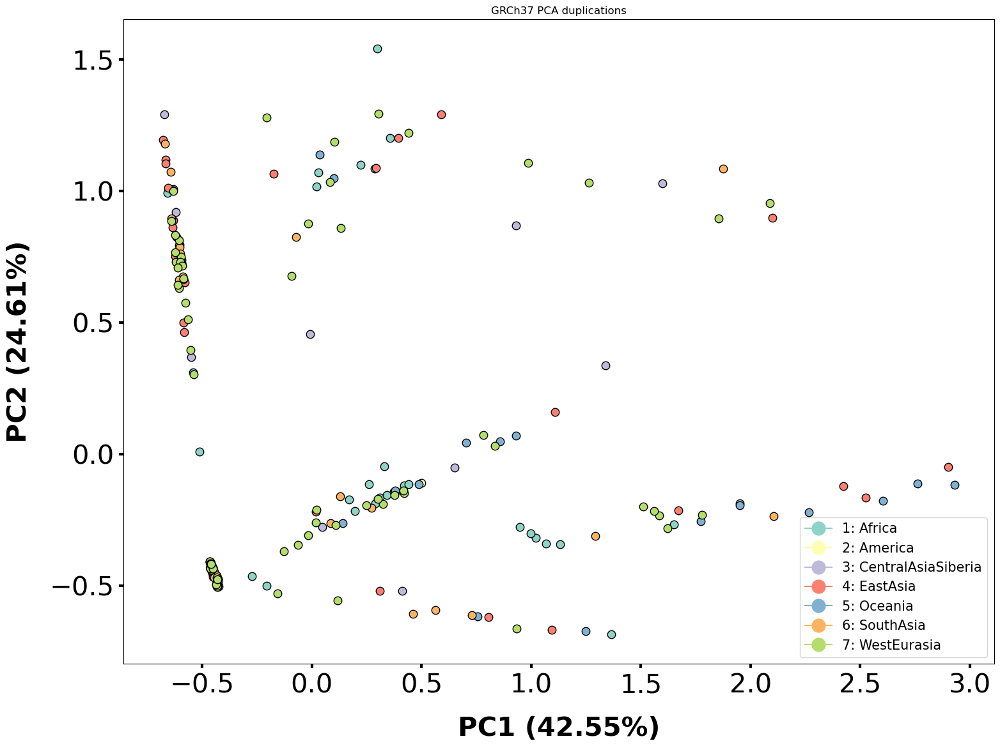

In [41]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (42.55%)', label_vertical='PC2 (24.61%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

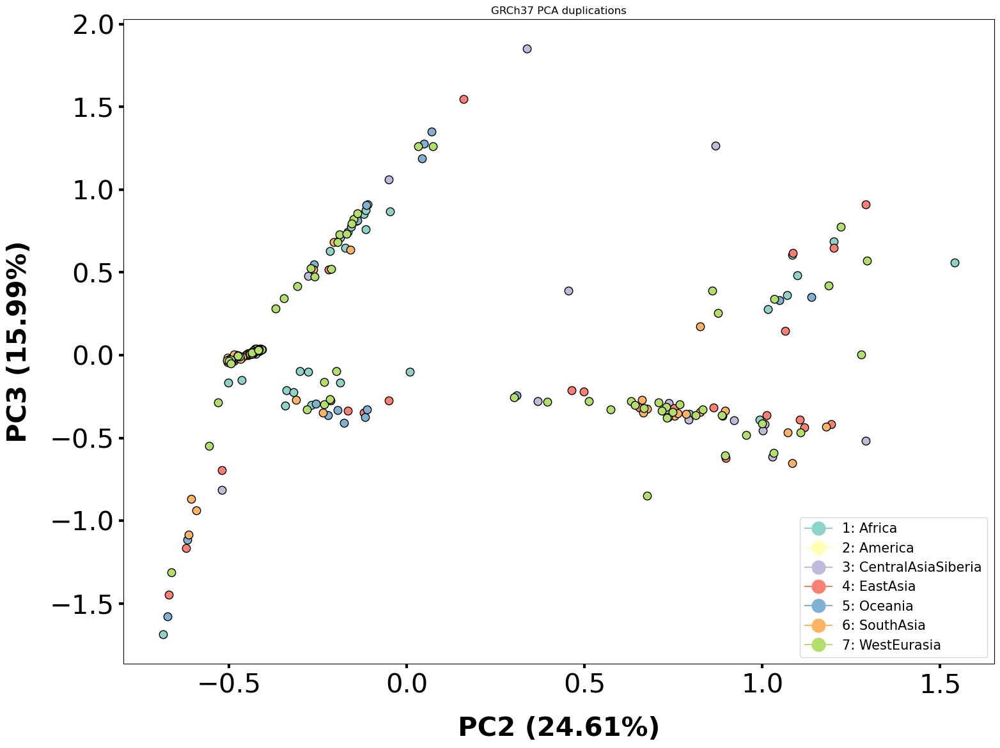

In [42]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (24.61%)', label_vertical='PC3 (15.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc23.png', transparent=True)

<h1> Dmean results 

In [ ]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

In [ ]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

In [ ]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


In [ ]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



In [ ]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [ ]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [ ]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

In [ ]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [ ]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)